In [3]:
from flu_matrix_completion import *

# Load in data from papers on H3N2 strains and antigenic mapping
Primarily using `HI_data_tables` class to keep track of data in a SQL datatables kind of way.

In [4]:
# Load in antisera-virus data as pd.DataFrames
HI_df = pd.read_csv("data/fonville_2014.csv", index_col='sampleID')
antisera_df = pd.read_csv("data/fonville_2014_antisera_table.csv", index_col='sampleID')
## Add data to HI_data_tables object
flu_data_tables = HI_data_tables() # Create HI_data_tables object
flu_data_tables.add_HI_data(HI_df=HI_df,
                            antisera_df=antisera_df) # Add data from Tal's ad Rong's original paper
flu_data_tables.compute_virus_dates() # Call compute_virus_dates method to compute years of virus

In [5]:
fonville_2014_groups = list(antisera_df.groupID.unique())
print(fonville_2014_groups)

['TableS1', 'TableS3', 'TableS5', 'TableS6', 'TableS13', 'TableS14']


In [4]:
# flu_data_tables.select_HI_data_by_group(group=fonville_2014_1_3_14).to_csv("data/fonville_2014_1_3_14.csv")
# antisera_df.iloc[[i in fonville_2014_1_3_14 for i in antisera_df['groupID']]].to_csv("data/fonville_2014_1_3_14_antisera_table.csv")

### How to use `HI_data_tables.select_HI_data_by_group` method

Text(0.5, 0.98, 'HI Heatmap for fonville 2014 antisera and H3N2 Strains')

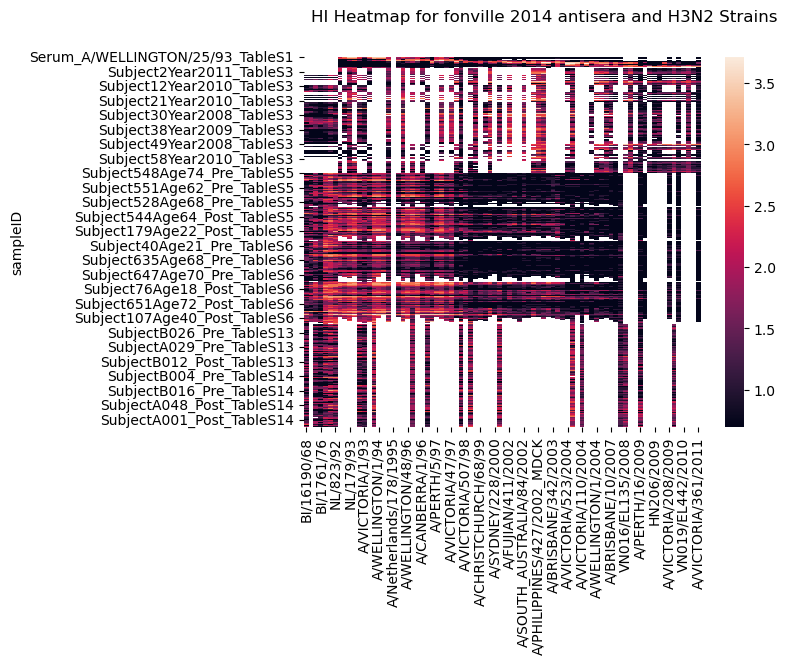

In [5]:
sns.heatmap(flu_data_tables.select_HI_data_by_group(group=fonville_2014_groups))
plt.suptitle('HI Heatmap for fonville 2014 antisera and H3N2 Strains')

['TableS1']
['TableS3']
['TableS5']
['TableS6']
['TableS13']
['TableS14']


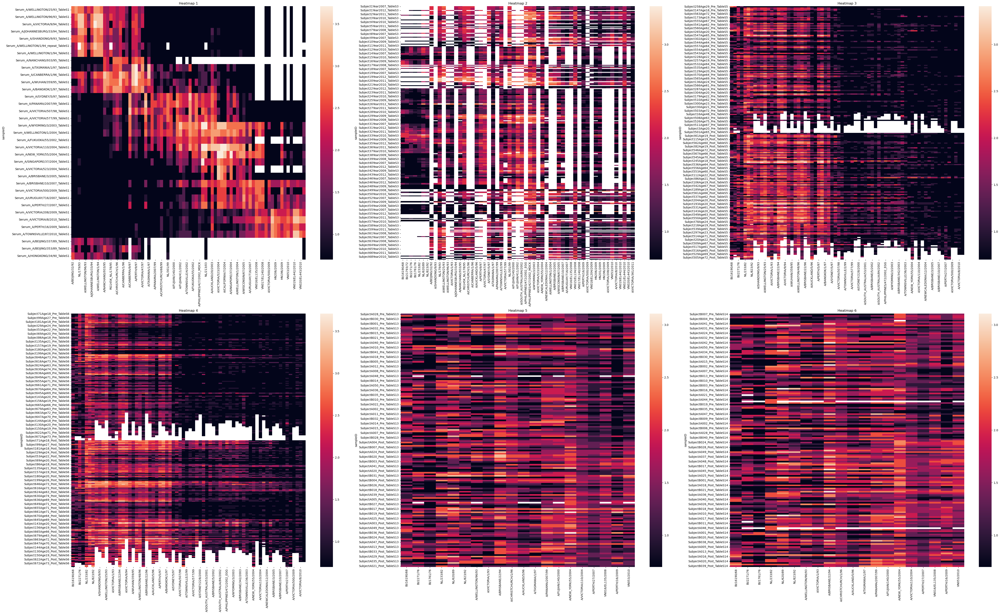

In [6]:
'''
Make a heatmap for each group
'''
fig, axs = plt.subplots(ncols=3, nrows=2, figsize=(50, 30))
# for i, ax in enumerate(axs):
#     data = flu_data_tables.select_HI_data_by_group(group=fonville_2014_groups[i])
#     sns.heatmap(data, ax=ax)
#     ax.set_title(f'Heatmap {i+1}')
    
# Looping through each subplot to plot a heatmap with each dataset
for i in range(2):
    for j in range(3):
        group = [fonville_2014_groups[i*3 + j]]
        print(group)
        data = flu_data_tables.select_HI_data_by_group(group=group).dropna(how='all', axis=1)
        sns.heatmap(data, ax=axs[i, j])
        axs[i, j].set_title(f'Heatmap {i*3 + j + 1}')

plt.tight_layout()
plt.show()

# Perform table-wise comparisons for each data group

# Analyses

## Load Fonville 2014 Data

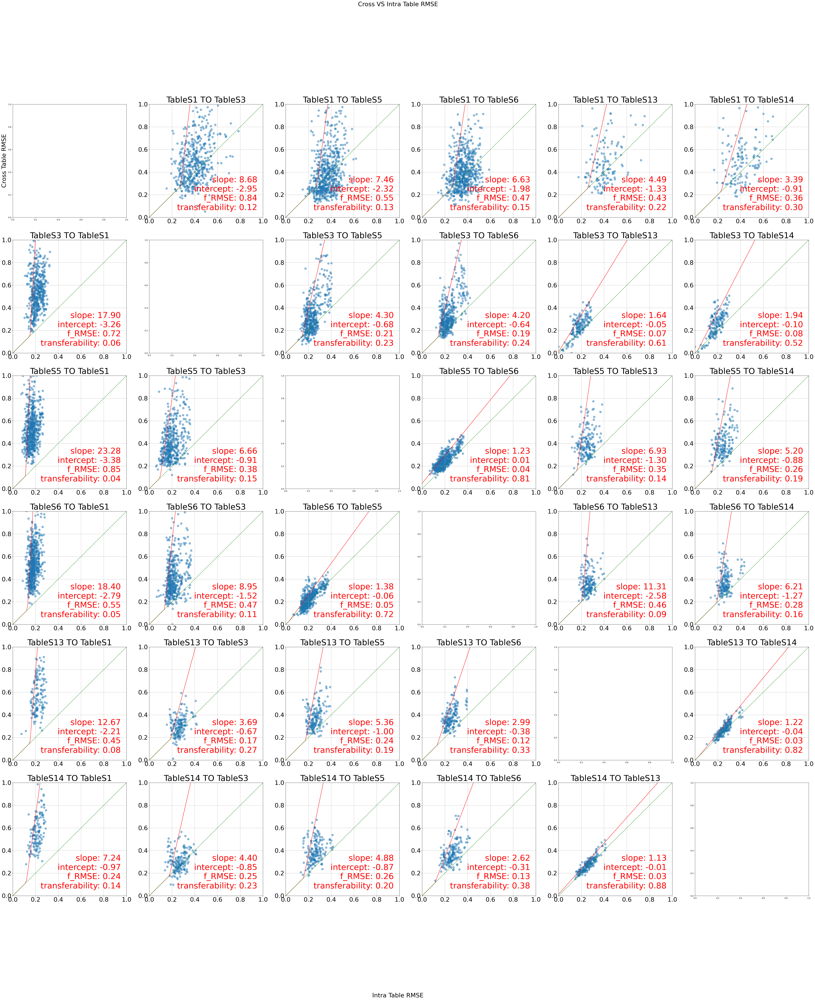

In [6]:
# Load in antisera-virus data as pd.DataFrames
fonville_2014_HI_df = pd.read_csv("data/fonville_2014.csv", index_col='sampleID')
fonville_2014_antisera_df = pd.read_csv("data/fonville_2014_antisera_table.csv", index_col='sampleID')
fonville_2014_HI_data_tables  = HI_data_tables() # Create HI_data_tables object
fonville_2014_HI_data_tables.add_HI_data(HI_df=fonville_2014_HI_df,
                               antisera_df=fonville_2014_antisera_df) # Add data from Tal's ad Rong's original paper
fonville_2014_HI_data_tables.compute_virus_dates()

np.random.seed(10)
train_trees=50
best_trees=10
n_features=5
f_sample = 0.7
fonville_2014_comparisons_obj = transferability_comparisons(HI_data_tables=fonville_2014_HI_data_tables)
model_name = f'fonville_2014_w_ODRs__traintrees{train_trees}_besttrees{best_trees}_regular_features{n_features}'
fonville_2014_comparisons_obj.load_data(path=f"models/{model_name}.pkl")
# fonville_2014_comparisons_obj.train_comparison_trees(train_trees=train_trees, best_trees=best_trees, n_features=n_features, f_sample=f_sample)
fonville_2014_comparisons_obj.compute_comparison_virus_ODR_df_dict()
fonville_2014_comparisons_obj.plot_comparisons_with_ODRs(save_to=f'figs/{model_name}.png', figsize=(70,70), s=100,  alpha=0.5)
fonville_2014_comparisons_obj.save_data(save_to=f"models/{model_name}.pkl")

# Load All Data

In [6]:
# Load in antisera-virus data as pd.DataFrames
all_HI_df = pd.read_csv("data/fonville_hinojosa_ertesvag_data.csv", index_col='sampleID')
all_antisera_df = pd.read_csv("data/fonville_merged_hinojosa_antisera_table.csv", index_col='sampleID')
all_HI_data_tables  = HI_data_tables() # Create HI_data_tables object
all_HI_data_tables.add_HI_data(HI_df=all_HI_df,
                               antisera_df=all_antisera_df) # Add data from Tal's ad Rong's original paper
all_HI_data_tables.compute_virus_dates()

In [51]:
TableS1 = all_HI_data_tables.select_HI_data_by_group(["TableS1"])
fon_ferrets = all_HI_data_tables.select_HI_data_by_group(["fon_ferrets"]).dropna(axis=1, how='all')
TableS6 = all_HI_data_tables.select_HI_data_by_group(["TableS6"]).dropna(axis=1, how='all').dropna(axis=0, how='any')
tables = [TableS1, fon_ferrets, TableS6]

In [52]:
def stat_make(table):
    return {'Patients': table.shape[0],
            'Viruses': table.shape[1],
            'Missing Values': sum(table.isna().sum()),
            'Mean': np.round(table.stack().mean(), 4),
            'SD': np.round(table.stack().std(), 4)}

In [53]:
TableS1.shape

(35, 82)

In [54]:
stats = [stat_make(table) for table in tables]
df = pd.DataFrame(stats)

In [55]:
df.index = ['2014 Foville Ferrets', '2016 Foville Ferrets', '1998 Parkville Patients']

In [57]:
print(df.T.to_string())

                2014 Foville Ferrets  2016 Foville Ferrets  1998 Parkville Patients
Patients                     35.0000               24.0000                 200.0000
Viruses                      82.0000               17.0000                  70.0000
Missing Values              622.0000                0.0000                   0.0000
Mean                          1.3835                1.5629                   1.2423
SD                            0.8503                0.8052                   0.6498


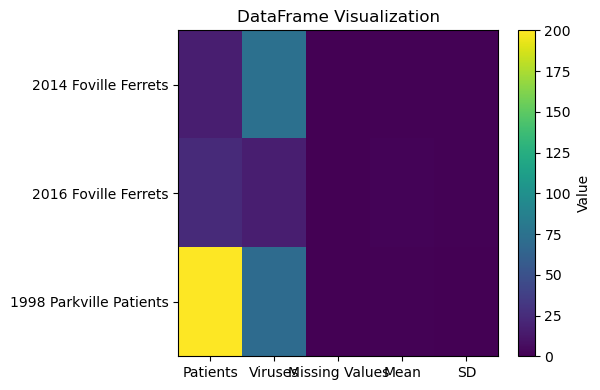

In [21]:
np.random.seed(10)
train_trees=50
best_trees=10
n_features=5
all_comparisons_obj = transferability_comparisons(HI_data_tables=all_HI_data_tables)
model_name = f'fon_hin_plot_w_ODRs__traintrees{train_trees}_besttrees{best_trees}_regular_features{n_features}'
all_comparisons_obj.load_data(path=f"models/{model_name}.pkl")
# all_comparisons_obj.train_comparison_trees(train_trees=train_trees, best_trees=best_trees, n_features=n_features)
all_comparisons_obj.compute_comparison_virus_ODR_df_dict()
# all_comparisons_obj.plot_comparisons(save_to='figs/fonville_2014_comparison_plot_traintrees200_besttrees20.png', alpha=0.4)
all_comparisons_obj.plot_comparisons_with_ODRs(save_to=f'figs/{model_name}.png', figsize=(200,200), s=100,  alpha=0.5)
all_comparisons_obj.save_data(save_to=f"models/{model_name}.pkl")

KeyError: 'TableS1 TO TableS3'

Error in callback <function flush_figures at 0x7fef0d0396c0> (for post_execute):


KeyboardInterrupt: 

['TableS1' 'TableS3' 'TableS5' 'TableS6' 'TableS13' 'TableS14'
 'fon_children' 'fon_ferrets' 'hin_vu14vi15_PreVac' 'hin_vu14vi15_PostVac'
 'hin_vu15vi16_PreVac' 'hin_vu15vi16_PostVac' 'hin_u15u16_PreVac'
 'hin_u15u16_PostVac']
Error: 'group' should be a list.


<Axes: ylabel='sampleID'>

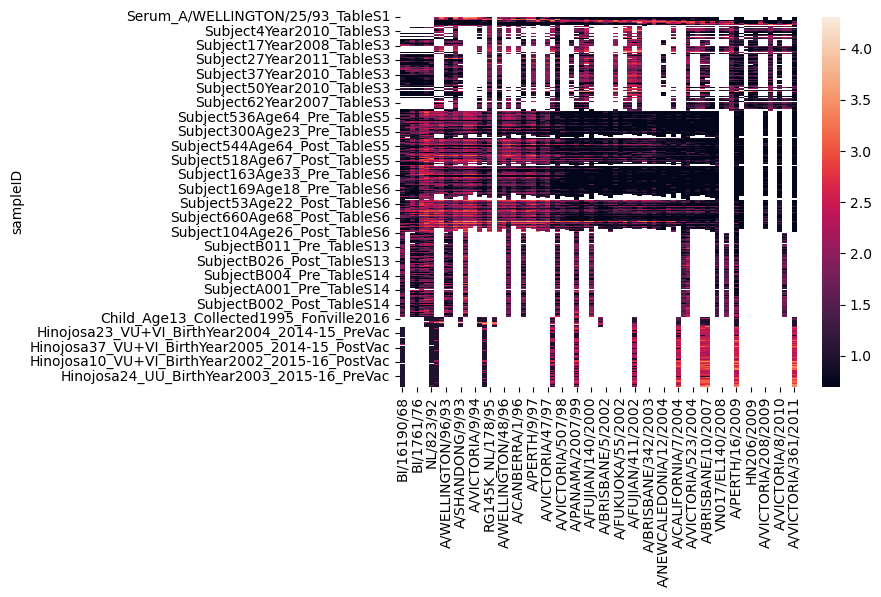

In [8]:
all_groups = all_antisera_df.groupID.unique()
print(all_groups)
sns.heatmap(all_HI_data_tables.select_HI_data_by_group(group=all_groups).dropna(how='all', axis=1))

# Prepare Predictions

In [367]:
S13_viruses = set(all_comparisons_obj.HI_data_tables.select_HI_data_by_group(["TableS13"]).dropna(axis=1, how='all').columns)
S14_viruses = set(all_comparisons_obj.HI_data_tables.select_HI_data_by_group(["TableS14"]).dropna(axis=1, how='all').columns)
S1_viruses = set(all_comparisons_obj.HI_data_tables.select_HI_data_by_group(["TableS1"]).dropna(axis=1, how='all').columns)


In [368]:
# Load in antisera-virus data as pd.DataFrames
fonville_2014_6_13_14_HI_df = pd.read_csv("data/fonville_2014_6_13_14.csv", index_col='sampleID')
fonville_2014_6_13_14_antisera_df = pd.read_csv("data/fonville_2014_6_13_14_antisera_table.csv", index_col='sampleID')
fonville_2014_6_13_14_HI_data_tables  = HI_data_tables() # Create HI_data_tables object
fonville_2014_6_13_14_HI_data_tables.add_HI_data(HI_df=fonville_2014_6_13_14_HI_df,
                               antisera_df=fonville_2014_6_13_14_antisera_df) # Add data from Tal's ad Rong's original paper
fonville_2014_6_13_14_HI_data_tables.compute_virus_dates()

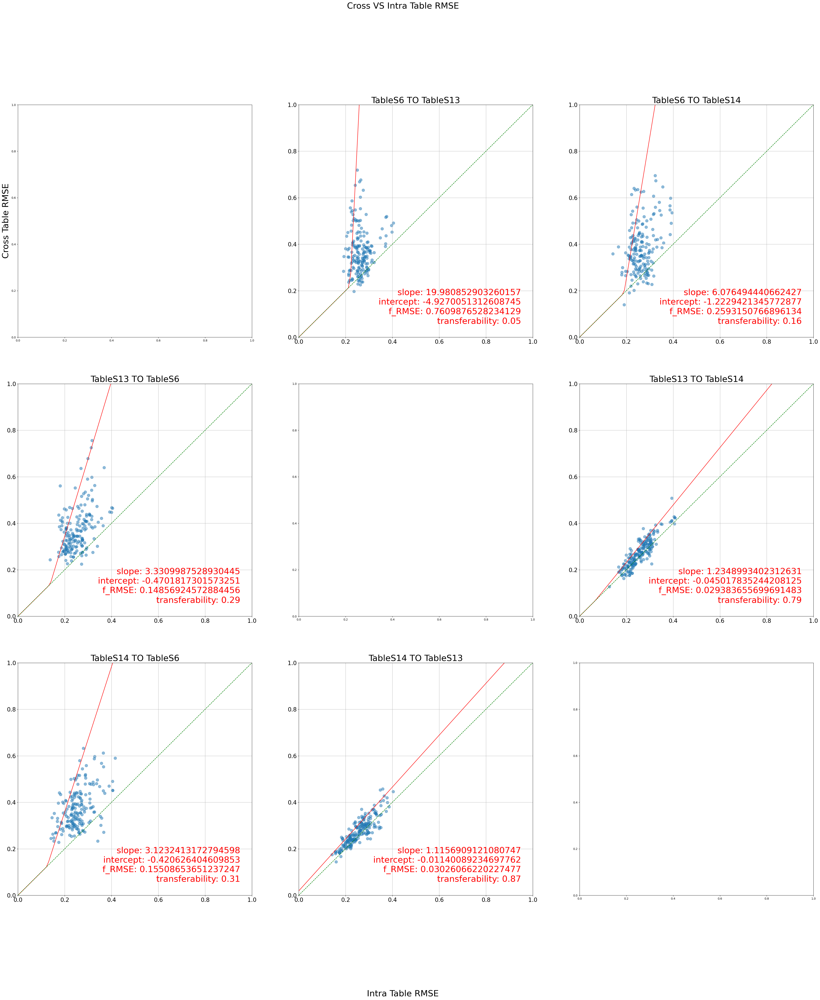

In [369]:
np.random.seed(10)
train_trees=50
best_trees=10
n_features=5
f_sample=0.7
fonville_2014_6_13_14_comparisons_obj = transferability_comparisons(HI_data_tables=fonville_2014_6_13_14_HI_data_tables)
model_name = f'fon_hin_plot_w_ODRs__traintrees{train_trees}_besttrees{best_trees}_regular_features{n_features}'
fonville_2014_6_13_14_comparisons_obj.train_comparison_trees(train_trees=train_trees, best_trees=best_trees, n_features=n_features, f_sample=f_sample)
fonville_2014_6_13_14_comparisons_obj.compute_comparison_virus_ODR_df_dict()
# fonville_2014_6_13_14_comparisons_obj.plot_comparisons(save_to='figs/fonville_2014_comparison_plot_traintrees200_besttrees20.png', alpha=0.4)
fonville_2014_6_13_14_comparisons_obj.plot_comparisons_with_ODRs(save_to=f'figs/{model_name}.png', figsize=(50,50), s=100,  alpha=0.5)
fonville_2014_6_13_14_comparisons_obj.save_data(save_to=f"models/{model_name}.pkl")

In [370]:
'''
Prepare a source for predictions:
- Identify a 2 datasets with good transferability
- Choose source dataset
- Train and cross validate a tree for every virus in source dataset, choosing 5 best trees per virus
    - Feats and target both come from source
    - Select viable virus features from viruses which overlap both datasets!
- Now with a tree for every virus in Dataset 1
    - Pull required feature viruses from Dataset 2 and make a prediction with the tree
- Put the prediction thing above into a loop to see how well Dataset2 can be reconstructed
'''

'''
Predictions:

1.) Train comparison on datasets
2.) Go to OBJ.comparison_dict  holds trees trained on source data that target other dataset's viruses
3.) Go to OBJ.comparison_dict[COMPARISON] to access each target virus
4.) Go to OBJ.comparison_dict[COMPARISON][VIRUS] to access each target virus's:
    - regression model (IMPORTANT)
    - intraRMSE
    - crossRMSE
    - feature viruses (IMPORTANT)
    - predictions
'''
def predict_target(m_best_trees_trainer_lists, target_dataset):
    '''
    Assuming target_dataset contains data for each virus in virus_col_sel
    
    dtr: model
    virus_col_sel: features to use for prediction
    feature_t: virus to be predicted in target_dataset
    '''
    predictions_to_be_meaned = []
    for l in m_best_trees_trainer_lists:
        dtr, _, _, virus_col_sel, feature_t, _, _ = l
        X = target_dataset[virus_col_sel]
        col_mean = (X).apply(lambda x: x.mean(), axis=1)
        centering_matrix =  np.outer(np.ones(X.shape[1]), col_mean).T
        X_m_centered = X - centering_matrix # Center data
        preds = dtr.predict(X_m_centered.to_numpy())
        predictions_to_be_meaned.append(preds + col_mean) # Uncenter prediction
    predictions_to_be_meaned = np.array(predictions_to_be_meaned)
    return np.mean(predictions_to_be_meaned, axis=0) # Returns a list of prediction corresponding to each antibody sera in target_dataset

def train_cross_dataset_model(source_table, target_table, n_feature = 7, f_sample=0.3, train_trees=50, best_trees=10):
    '''
    Returns a dict where "viable" viruses are keys and m_best_trees_trainer_lists are values
    '''
    source_table_feature_set = set(source_table.columns)
    target_table_feature_set = set(target_table.columns)
    intersection = list(source_table_feature_set.intersection(target_table_feature_set)) # Train trees on random samples from intersection
    
    m_best_trees_trainer_lists_per_target_virus = dict()
    for feature_t in intersection:
        selected_viruses_list = np.random.choice(intersection, n_feature) # Might need to tweak this step to consider depth of data...
        source_table_trees = m_best_trees_trainer(target_table = source_table,
                                                  source_tables = [source_table],
                                                  feature_t = feature_t,
                                                  selected_viruses_list= False,
                                                  n_feature = n_feature,
                                                  f_sample=f_sample,
                                                  train_trees=train_trees,
                                                  best_trees=best_trees)
        m_best_trees_trainer_lists_per_target_virus[feature_t] = source_table_trees
    return m_best_trees_trainer_lists_per_target_virus, intersection # intersection will tell you which virus to assign to your predictions

def compute_predicted_df(m_best_trees_trainer_lists_per_target_virus, intersection, target_dataset):
    
    df = pd.DataFrame(np.nan, index=target_dataset.index, columns=target_dataset.columns)
    
    for key in m_best_trees_trainer_lists_per_target_virus:
#         for sera in target_dataset.index:
#             print()
        m_best_trees_trainer_lists = m_best_trees_trainer_lists_per_target_virus[key]
        df.loc[:, key] = predict_target(m_best_trees_trainer_lists, target_dataset)
        
    return df.dropna(axis=0, how='all')


In [371]:
source_table = all_HI_data_tables.select_HI_data_by_group(group=['TableS13']).dropna(axis=1, how='all').dropna(axis=0, how='any')
target_table = all_HI_data_tables.select_HI_data_by_group(group=['TableS14']).dropna(axis=1, how='all').dropna(axis=0, how='any')

m_best_trees_trainer_lists_per_target_virus, intersection = train_cross_dataset_model(source_table, target_table, n_feature = 5, f_sample=0.8, train_trees=50, best_trees=10)
target_table_predictions = compute_predicted_df(m_best_trees_trainer_lists_per_target_virus, intersection, target_table)

RMSE = np.sqrt(np.mean((10**target_table_predictions - 10**target_table)**2))
print(RMSE)
sns.heatmap(10**target_table_predictions)
plt.show()
sns.heatmap(10**target_table.loc[:, target_table_predictions.columns])
plt.show()
sns.heatmap(10**source_table.loc[:, target_table_predictions.columns])

# 2014 and 2016 Fonville Ferrets

<Axes: ylabel='sampleID'>

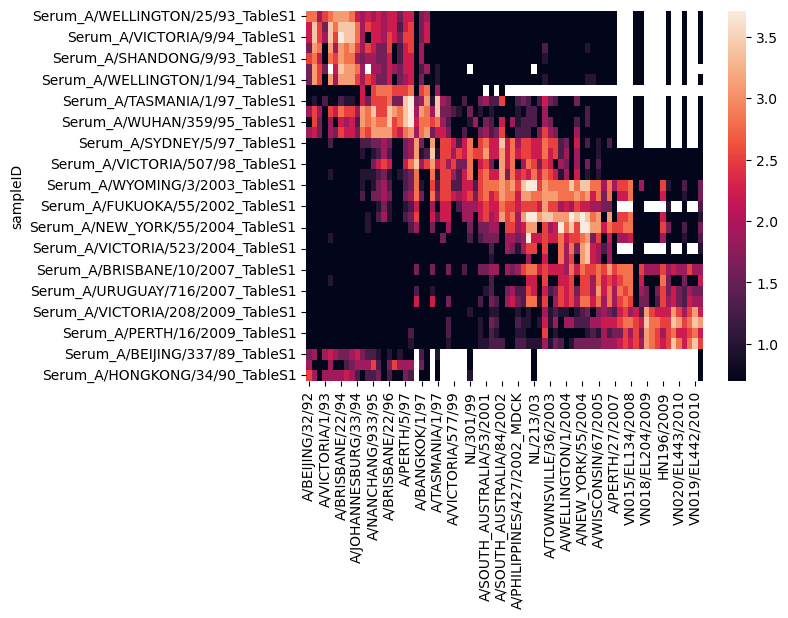

In [88]:
sns.heatmap(all_HI_data_tables.select_HI_data_by_group(group=["TableS1"]).dropna(how='all', axis=1))

<Axes: ylabel='sampleID'>

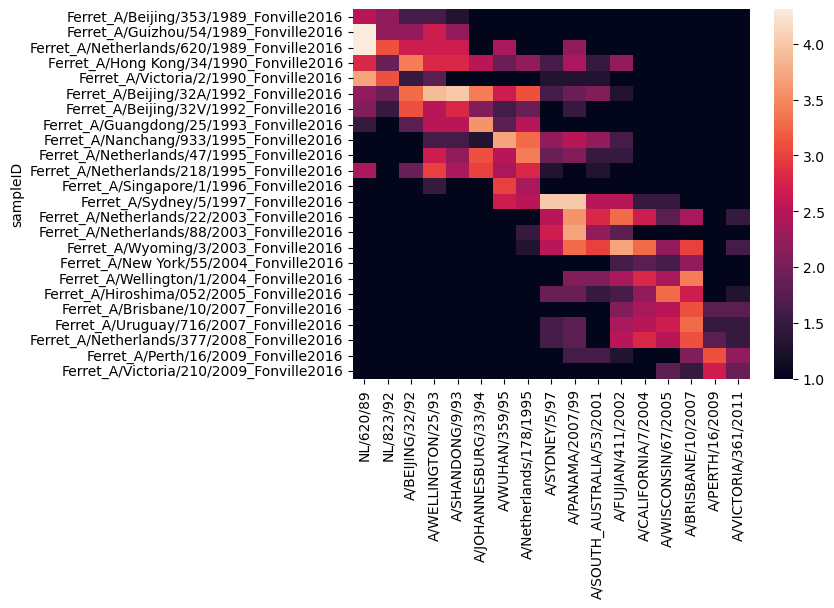

In [89]:
sns.heatmap(all_HI_data_tables.select_HI_data_by_group(group=["fon_ferrets"]).dropna(how='all', axis=1))

<Axes: ylabel='sampleID'>

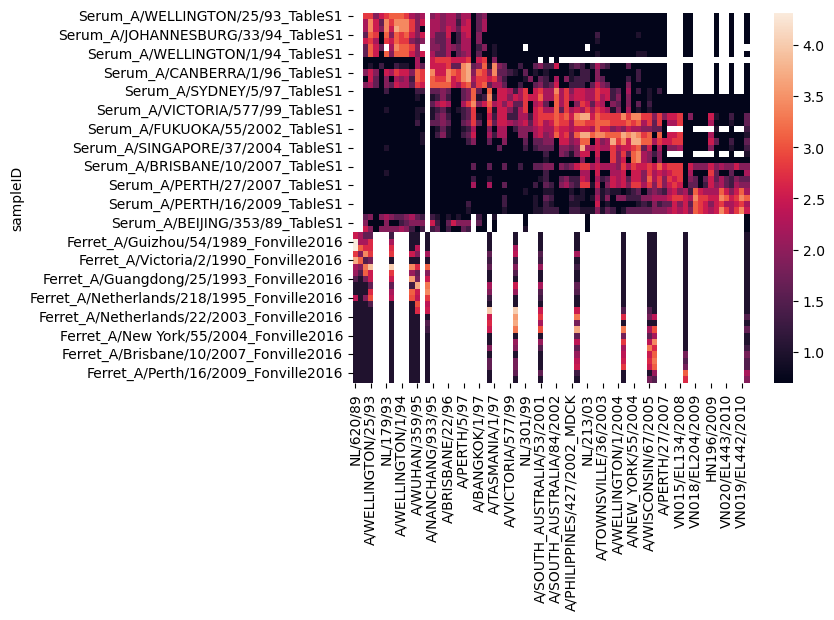

In [11]:
sns.heatmap(all_HI_data_tables.select_HI_data_by_group(group=["TableS1", "hin","fon_ferrets"]).dropna(how='all', axis=1))

In [31]:
fon_ferrets_2016_viruses = all_HI_data_tables.select_HI_data_by_group(group=["fon_ferrets"]).dropna(axis=1, how="all").columns
fon_ferrets_2014_viruses = all_HI_data_tables.select_HI_data_by_group(group=["TableS1"]).dropna(axis=1, how="all").columns

In [34]:
fon_ferrets_2016_viruses = all_HI_data_tables.select_HI_data_by_group(group=["fon_ferrets"]).dropna(axis=1, how="all").columns
fon_ferrets_2014_viruses = all_HI_data_tables.select_HI_data_by_group(group=["TableS1"]).dropna(axis=1, how="all").columns
print(len(fon_ferrets_2016_viruses), len(fon_ferrets_2014_viruses))
len(set(fon_ferrets_2014_viruses).intersection(set(fon_ferrets_2016_viruses)))

17 74


In [81]:
fon_ferrets_2014_viruses

Index(['A/BEIJING/32/92', 'A/WELLINGTON/25/93', 'A/WELLINGTON/96/93',
       'A/VICTORIA/1/93', 'NL/179/93', 'A/SHANDONG/9/93', 'A/BRISBANE/22/94',
       'A/WELLINGTON/1/94', 'A/VICTORIA/9/94', 'A/JOHANNESBURG/33/94',
       'A/WUHAN/359/95', 'RG145K_NL/178/95', 'A/NANCHANG/933/95',
       'A/WELLINGTON/48/96', 'A/CHRISTCHURCH/1/96', 'A/BRISBANE/22/96',
       'A/CANBERRA/1/96', 'A/AUCKLAND/5/96', 'A/PERTH/5/97', 'A/PERTH/9/97',
       'A/CANBERRA/9/97', 'A/BANGKOK/1/97', 'A/VICTORIA/47/97',
       'A/SYDNEY/5/97', 'A/TASMANIA/1/97', 'A/VICTORIA/507/98',
       'A/CHRISTCHURCH/68/99', 'A/VICTORIA/577/99', 'A/PANAMA/2007/99',
       'A/TOWNSVILLE/2/99', 'NL/301/99', 'A/FUJIAN/140/2000',
       'A/SYDNEY/228/2000', 'A/SOUTH_AUSTRALIA/53/2001', 'A/BRISBANE/5/2002',
       'A/TOWNSVILLE/4/2002', 'A/SOUTH_AUSTRALIA/84/2002', 'A/FUKUOKA/55/2002',
       'A/PHILIPPINES/472/2002_EGG', 'A/PHILIPPINES/427/2002_MDCK',
       'A/FUJIAN/411/2002', 'A/WYOMING/3/2003', 'NL/213/03',
       'A/BRISBAN

In [65]:
fon_ferrets_2016_viruses

Index(['NL/620/89', 'NL/823/92', 'A/BEIJING/32/92', 'A/WELLINGTON/25/93',
       'A/SHANDONG/9/93', 'A/JOHANNESBURG/33/94', 'A/WUHAN/359/95',
       'A/Netherlands/178/1995', 'A/SYDNEY/5/97', 'A/PANAMA/2007/99',
       'A/SOUTH_AUSTRALIA/53/2001', 'A/FUJIAN/411/2002', 'A/CALIFORNIA/7/2004',
       'A/WISCONSIN/67/2005', 'A/BRISBANE/10/2007', 'A/PERTH/16/2009',
       'A/VICTORIA/361/2011'],
      dtype='object')

In [62]:
# Load in relevant fonville ferret 2014 dfs
fonville_2014_ferrets_df = all_HI_data_tables.select_HI_data_by_group(group=["TableS1"])
fonville_2014_ferrets_antisera_df = all_HI_data_tables.antisera_table[pd.DataFrame(all_antisera_df["groupID"]=="TableS1")['groupID'].tolist()]

# Load in relevant fonville ferret 2016 dfs
fonville_2016_ferrets_df = all_HI_data_tables.select_HI_data_by_group(group=["fon_ferrets"])
fonville_2016_ferrets_antisera_df = all_HI_data_tables.antisera_table[pd.DataFrame(all_antisera_df["groupID"]=="fon_ferrets")['groupID'].tolist()]

## Add data to HI_data_tables object
fonville_2014_2016_ferrets_data_tables = HI_data_tables() # Create HI_data_tables object
fonville_2014_2016_ferrets_data_tables.add_HI_data(HI_df=fonville_2014_ferrets_df,
                                              antisera_df=fonville_2014_ferrets_antisera_df) # Add data from Tal's ad Rong's original paper
fonville_2014_2016_ferrets_data_tables.add_HI_data(HI_df=fonville_2016_ferrets_df,
                                              antisera_df=fonville_2016_ferrets_antisera_df) # Add data from Tal's ad Rong's original paper
fonville_2014_2016_ferrets_data_tables.compute_virus_dates() # Call compute_virus_dates method to compute years of virus


np.random.seed(10)
fonville_2014_2016_ferrets_data_tables_comparisons_obj = transferability_comparisons(HI_data_tables=fonville_2014_2016_ferrets_data_tables)
fonville_2014_2016_ferrets_data_tables_comparisons_obj.train_comparison_trees(train_trees=10, best_trees=5, n_feature=5, f_sample=0.3) # Tweak hyperparams: train_trees, n_feature (doesn't change much), f_sample (doesn't change much)

14

In [63]:
fonville_2014_2016_ferrets_data_tables_comparisons_obj.compute_comparison_virus_ODR_df_dict()

In [64]:
fonville_2014_2016_ferrets_data_tables_comparisons_obj.plot_comparisons_with_ODRs()

# Fonville 2014 S13 to S14

In [90]:
fon_human_2014_S13_viruses = all_HI_data_tables.select_HI_data_by_group(group=["TableS13"]).dropna(axis=1, how="all").columns
fon_human_2014_S14_viruses = all_HI_data_tables.select_HI_data_by_group(group=["TableS14"]).dropna(axis=1, how="all").columns
print(len(fon_human_2014_S13_viruses), len(fon_human_2014_S14_viruses))
len(set(fon_human_2014_S13_viruses).intersection(set(fon_human_2014_S14_viruses)))

20 20


20

In [91]:
# Load in relevant fonville ferret 2014 dfs
fon_human_2014_S13_df = all_HI_data_tables.select_HI_data_by_group(group=["TableS13"])
fon_human_2014_S13_antisera_df = all_HI_data_tables.antisera_table[pd.DataFrame(all_antisera_df["groupID"]=="TableS13")['groupID'].tolist()]

# Load in relevant fonville ferret 2016 dfs
fon_human_2014_S14_df = all_HI_data_tables.select_HI_data_by_group(group=["TableS14"])
fon_human_2014_S14_antisera_df = all_HI_data_tables.antisera_table[pd.DataFrame(all_antisera_df["groupID"]=="TableS14")['groupID'].tolist()]

## Add data to HI_data_tables object
fonville_2014_human_data_tables = HI_data_tables() # Create HI_data_tables object
fonville_2014_human_data_tables.add_HI_data(HI_df=fon_human_2014_S13_df,
                                              antisera_df=fon_human_2014_S13_antisera_df) # Add data from Tal's ad Rong's original paper
fonville_2014_human_data_tables.add_HI_data(HI_df=fon_human_2014_S14_df,
                                              antisera_df=fon_human_2014_S14_antisera_df) # Add data from Tal's ad Rong's original paper
fonville_2014_human_data_tables.compute_virus_dates() # Call compute_virus_dates method to compute years of virus


np.random.seed(10)
fonville_2014_human_data_tables_comparisons_obj = transferability_comparisons(HI_data_tables=fonville_2014_human_data_tables)
fonville_2014_human_data_tables_comparisons_obj.train_comparison_trees(train_trees=10, best_trees=5, n_feature=5, f_sample=0.3) # Tweak hyperparams: train_trees, n_feature (doesn't change much), f_sample (doesn't change much)

In [92]:
fonville_2014_human_data_tables_comparisons_obj.compute_comparison_virus_ODR_df_dict()

In [93]:
fonville_2014_2016_ferrets_data_tables_comparisons_obj.plot_comparisons_with_ODRs()

In [18]:
extra_groups = ['fon_children', 'fon_ferrets', 'hin_vu14vi15_PreVac',
       'hin_vu14vi15_PostVac', 'hin_vu15vi16_PreVac',
       'hin_vu15vi16_PostVac', 'hin_u15u16_PreVac', 'hin_u15u16_PostVac']
ferrets_group = ['fon_ferrets']
extra_flu_df = extra_flu_data_tables.select_HI_data_by_group(group=ferrets_group).set_index("sampleID")

<Axes: ylabel='sampleID'>

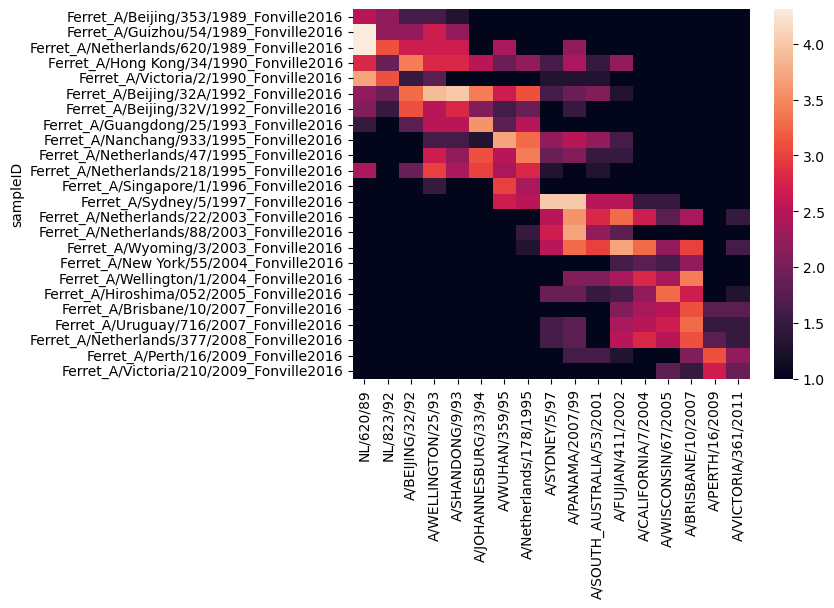

In [19]:
sns.heatmap(extra_flu_df.dropna(axis=1, how="all"))

In [ ]:
# RMSE: Feed coords of scatter into line model

In [14]:
x = comparisons_obj.intra_RMSE_dict['TableS3 TO TableS1']
y = comparisons_obj.cross_RMSE_dict['TableS3 TO TableS1']

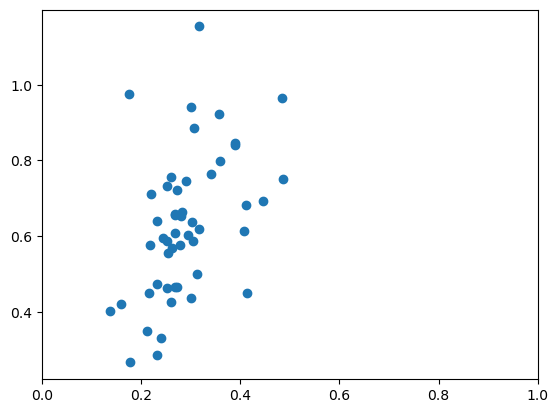

In [15]:
plt.scatter(x, y)
plt.xlim(0,1)

fitted_x = 2.65*np.array(x) - 0.14

In [16]:
sum((fitted_x - np.array(y))**2)/len(fitted_x) # This is how, use fitted function on x instead, use y=x portion if x points do fall there (piecewise)

0.04122676997477003

In [18]:
comparisons_obj.comparison_ODR_df_dict['TableS3 TO TableS14'][-1][0]

IndexError: invalid index to scalar variable.

# See how combining trees trained on different datasets can impact performance

### Compute `comparison_combiner_dict`

In [7]:
comparisons_obj.compute_comparison_combiner_dict()

In [33]:
all_antisera_df.groupID.unique()

array(['TableS1', 'TableS3', 'TableS5', 'TableS6', 'TableS13', 'TableS14',
       'fon_children', 'fon_ferrets', 'hin_vu14vi15_PreVac',
       'hin_vu14vi15_PostVac', 'hin_vu15vi16_PreVac',
       'hin_vu15vi16_PostVac', 'hin_u15u16_PreVac', 'hin_u15u16_PostVac'],
      dtype=object)

### Visualize how model trained on TableS13 performs for predicting HI for TableS14 viruses

# 2016 Fonville Ferrets

In [6]:
extra_HI_df = pd.read_csv("data/fonville_hinojosa_ertesvag_data.csv")
extra_antisera_df = pd.read_csv("data/fonville_hinojosa_ertesvag_antisera_table.csv")

extra_flu_data_tables = HI_data_tables() # Create HI_data_tables object
extra_flu_data_tables.add_HI_data(HI_df=extra_HI_df,
                                  antisera_df=extra_antisera_df) # Add data from Tal's ad Rong's original paper
extra_flu_data_tables.compute_virus_dates() # Call compute_virus_dates method to compute years of virus

In [32]:
preds, errs = combine_predictions(target_virus_name='A/AUCKLAND/5/96',
                                  target_table_name='TableS14',
                                  source_table_names=['TableS13'],
                                  comparison_combiner_dict=all_comparisons_obj.comparison_combiner_dict)
log10_HAI_measurements, log10_mu, constant_errors = all_comparisons_obj.comparison_combiner_dict['TableS13 TO TableS14']['A/AUCKLAND/5/96']['error_bar_data']
error_predict, error_actual = all_comparisons_obj.comparison_combiner_dict['TableS13 TO TableS14']['A/AUCKLAND/5/96']['error_predict_actual']

y = np.log10(preds)
yerr = [errs]*len(log10_HAI_measurements)
plt.errorbar(HAI_measurements, y, yerr=yerr, fmt='o')
sns.lineplot(x=[0, 2.5], y=[0, 2.5], label="Diagonal Line (y = x)", linestyle='--', color='black')
print("error predict:", 10**errs) 
print("error actual:", error_actual)

TypeError: 'NoneType' object is not subscriptable

error: 1.5868530749877263


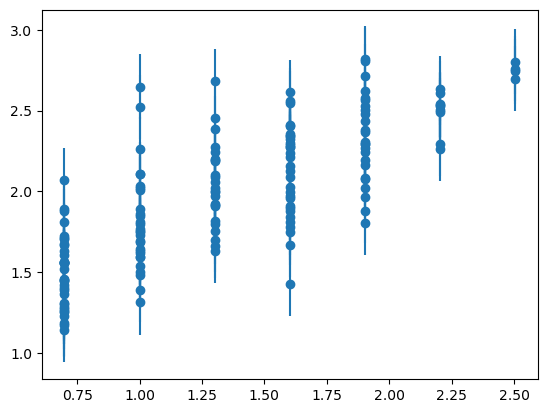

### S3 to S14

In [1]:
preds, errs = combine_predictions(target_virus_name='NL/620/89',
                                  target_table_name='TableS14',
                                  source_table_names=['TableS3'],
                                  comparison_combiner_dict=comparisons_obj.comparison_combiner_dict)
log10_HAI_measurements, log10_mu, constant_errors = comparisons_obj.comparison_combiner_dict['TableS3 TO TableS14']['NL/620/89']['error_bar_data']
error_predict, error_actual = comparisons_obj.comparison_combiner_dict['TableS3 TO TableS14']['NL/620/89']['error_predict_actual']

y = np.log10(preds)
yerr = [errs]*len(log10_HAI_measurements)
plt.errorbar(HAI_measurements, y, yerr=yerr, fmt='o')
sns.lineplot(x=[0, 2.5], y=[0, 2.5], label="Diagonal Line (y = x)", linestyle='--', color='black')
print("error predict:", 10**errs) 
print("error actual:", error_actual)

NameError: name 'combine_predictions' is not defined

### S1 to S14

In [12]:
comparisons_obj.HI_data_tables.HI_data.columns

Index(['BI/16190/68', 'BI/21793/72', 'BI/2271/76', 'BI/1761/76', 'NL/233/82',
       'NL/620/89', 'NL/823/92', 'A/BEIJING/32/92', 'A/WELLINGTON/25/93',
       'A/WELLINGTON/96/93', 'A/VICTORIA/1/93', 'NL/179/93', 'A/SHANDONG/9/93',
       'A/BRISBANE/22/94', 'A/WELLINGTON/1/94', 'A/VICTORIA/9/94',
       'A/JOHANNESBURG/33/94', 'A/WUHAN/359/95', 'RG145K_NL/178/95',
       'A/Netherlands/178/1995', 'A/NANCHANG/933/95', 'A/WELLINGTON/48/96',
       'A/CHRISTCHURCH/1/96', 'A/BRISBANE/22/96', 'A/CANBERRA/1/96',
       'A/AUCKLAND/5/96', 'A/PERTH/5/97', 'A/PERTH/9/97', 'A/CANBERRA/9/97',
       'A/BANGKOK/1/97', 'A/VICTORIA/47/97', 'A/SYDNEY/5/97',
       'A/TASMANIA/1/97', 'A/VICTORIA/507/98', 'A/CHRISTCHURCH/68/99',
       'A/VICTORIA/577/99', 'A/PANAMA/2007/99', 'A/TOWNSVILLE/2/99',
       'NL/301/99', 'A/FUJIAN/140/2000', 'A/SYDNEY/228/2000',
       'A/SOUTH_AUSTRALIA/53/2001', 'A/BRISBANE/5/2002', 'A/TOWNSVILLE/4/2002',
       'A/SOUTH_AUSTRALIA/84/2002', 'A/FUKUOKA/55/2002',
       'A

error predict: 135.69547814826623
error actual: 10.191875168709881


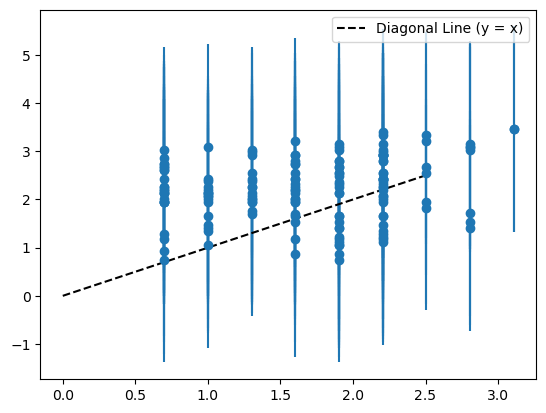

In [47]:
preds, errs = combine_predictions(target_virus_name='A/VICTORIA/110/2004',
                                  target_table_name='TableS14',
                                  source_table_names=['TableS1'],
                                  comparison_combiner_dict=comparisons_obj.comparison_combiner_dict)
log10_HAI_measurements, log10_mu, constant_errors = comparisons_obj.comparison_combiner_dict['TableS1 TO TableS14']['A/VICTORIA/110/2004']['error_bar_data']
error_predict, error_actual = comparisons_obj.comparison_combiner_dict['TableS1 TO TableS14']['A/VICTORIA/110/2004']['error_predict_actual']

y = np.log10(preds)
yerr = [errs]*len(log10_HAI_measurements)
plt.errorbar(HAI_measurements, y, yerr=yerr, fmt='o')
sns.lineplot(x=[0, 2.5], y=[0, 2.5], label="Diagonal Line (y = x)", linestyle='--', color='black')
print("error predict:", 10**errs) 
print("error actual:", error_actual)

### Visualize how combining models trained on 'TableS13', 'TableS1', and 'TableS3'  affects performance when predicting HI for TableS14 viruses
Error goes down quite a bit!

In [15]:
preds, errs = combine_predictions(target_virus_name='A/AUCKLAND/5/96',
                                  target_table_name='TableS14',
                                  source_table_names=['TableS13', 'TableS1', 'TableS3'],
                                  comparison_combiner_dict=comparisons_obj.comparison_combiner_dict)
HAI_measurements, _, _ = comparisons_obj.comparison_combiner_dict['TableS13 TO TableS14']['A/AUCKLAND/5/96']['error_bar_data']
y = np.log10(preds)
yerr = [errs]*len(HAI_measurements)
plt.errorbar(HAI_measurements,y, yerr=yerr, fmt='o')

print("error:", 10**errs) # hmmm, adding datasets did seem to improve error!. Funny


[0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344027489,
 0.5957470344